In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## Esercizio 04.1

In [2]:
df=pd.read_csv('pofv_MB.dat', header=None, names=['#vel', 'avg', 'prog_av', 'err'], skiprows=1,
               sep="\s+")

<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_543294/1159708210.py:2: SyntaxWarning: invalid escape sequence '\s'
  sep="\s+")


In [3]:

df['avg_norm']=df['avg']/108


df['err_norm']=df['err']/108


In [4]:
df

,#vel,avg,prog_av,err,avg_norm,err_norm
0,0.188562,0.0025,0.0025,0.0,0.000023,0.0
1,0.565685,2.3555,2.3555,0.0,0.021810,0.0
2,0.942809,5.6575,5.6575,0.0,0.052384,0.0
3,1.319930,10.9190,10.9190,0.0,0.101102,0.0
4,1.697060,14.8300,14.8300,0.0,0.137315,0.0
...,...,...,...,...,...,...
595,9.616650,0.0000,0.0000,0.0,0.000000,0.0
596,9.993780,0.0000,0.0000,0.0,0.000000,0.0
597,10.370900,0.0000,0.0000,0.0,0.000000,0.0
598,10.748000,0.0000,0.0000,0.0,0.000000,0.0


In [5]:
def MB(v:np.array, temp:float):
    return (1/((2*np.pi*temp)**(1.5)))*4*np.pi*(v**2)*np.exp(-(v**2)/(2*temp))

In [6]:
from scipy.optimize import curve_fit

In [7]:
df['block']=0
counter=0
df['block']=df.index//30
#for k in df.index[:]:
#    if k%30==0:
#        counter+=1
#    df['block'][k]=counter
    

In [8]:
df

,#vel,avg,prog_av,err,avg_norm,err_norm,block
0,0.188562,0.0025,0.0025,0.0,0.000023,0.0,0
1,0.565685,2.3555,2.3555,0.0,0.021810,0.0,0
2,0.942809,5.6575,5.6575,0.0,0.052384,0.0,0
3,1.319930,10.9190,10.9190,0.0,0.101102,0.0,0
4,1.697060,14.8300,14.8300,0.0,0.137315,0.0,0
...,...,...,...,...,...,...,...
595,9.616650,0.0000,0.0000,0.0,0.000000,0.0,19
596,9.993780,0.0000,0.0000,0.0,0.000000,0.0,19
597,10.370900,0.0000,0.0000,0.0,0.000000,0.0,19
598,10.748000,0.0000,0.0000,0.0,0.000000,0.0,19


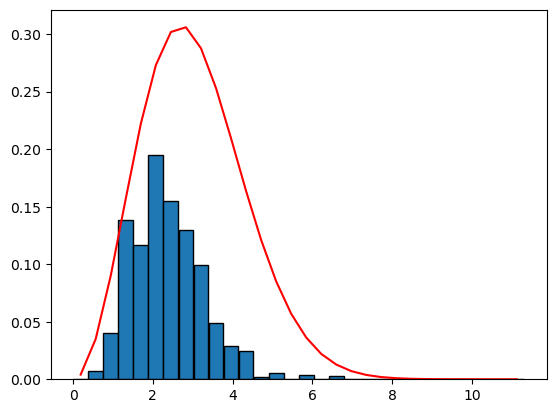

In [22]:
df0=df.loc[df['block']==1]
plt.bar(df0['#vel'], df0['avg_norm'], width=df0['#vel'].max()/30, edgecolor='black')
plt.plot(df0['#vel'], MB(df0['#vel'], temp), c='r')

np.float64(1.0)

In [18]:
temp=curve_fit(MB, df0['#vel'], df0['avg_norm'])[0]
temp

array([3.64991254])

In [11]:
mb=MB(df0['#vel'], temp)

mb.argmax()

np.int64(7)

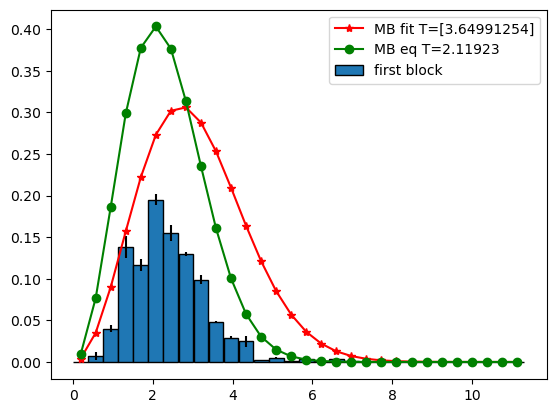

In [12]:
plt.bar(df0['#vel'], df0['avg_norm'], yerr=df0['err_norm'], label='first block', width=df0['#vel'].max()/30, edgecolor='black')
plt.plot(df0['#vel'], MB(df0['#vel'], temp), marker='*', c='r', label=f'MB fit T={temp}')
plt.plot(df0['#vel'], MB(df0['#vel'], 2.11923), marker='o', c='g', label=f'MB eq T={2.11923}')
#plt.vlines(df0['#vel'][9], ymin=0, ymax=7, colors='r')
plt.legend()
plt.show()

In [82]:
df

,#vel,avg,prog_av,err,avg_norm,err_norm,block
0,0.188562,0.0025,0.0025,0.0,0.000083,0.0,0
1,0.565685,2.3555,2.3555,0.0,0.078517,0.0,0
2,0.942809,5.6575,5.6575,0.0,0.188583,0.0,0
3,1.319930,10.9190,10.9190,0.0,0.363967,0.0,0
4,1.697060,14.8300,14.8300,0.0,0.494333,0.0,0
...,...,...,...,...,...,...,...
595,9.616650,0.0000,0.0000,0.0,0.000000,0.0,19
596,9.993780,0.0000,0.0000,0.0,0.000000,0.0,19
597,10.370900,0.0000,0.0000,0.0,0.000000,0.0,19
598,10.748000,0.0000,0.0000,0.0,0.000000,0.0,19


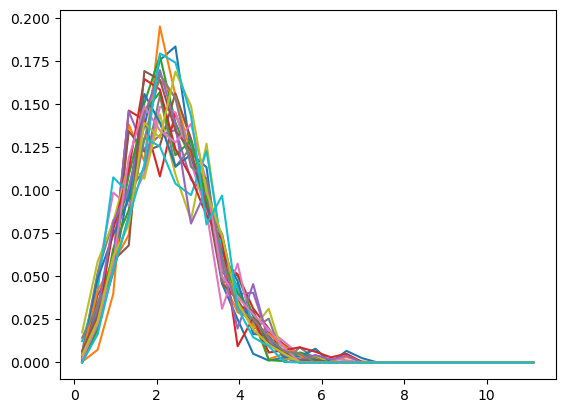

In [15]:
for k in df.block.unique():
    plt.plot(df.loc[df['block']==k]['#vel'],df.loc[df['block']==k]['avg_norm'])

In [16]:
temp=pd.read_csv('NSL_SIMULATOR/OUTPUT/temperature.dat', skiprows=1, names=['BLOCK', 'ACTUAL_T', 'T_AVE', 'ERROR'], sep="\s+")
temp

<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_543294/3064566595.py:1: SyntaxWarning: invalid escape sequence '\s'
  temp=pd.read_csv('NSL_SIMULATOR/OUTPUT/temperature.dat', skiprows=1, names=['BLOCK', 'ACTUAL_T', 'T_AVE', 'ERROR'], sep="\s+")


,BLOCK,ACTUAL_T,T_AVE,ERROR
0,1,2.11923,2.11923,0.000000
1,2,2.15294,2.13608,0.011917
2,3,2.16769,2.14662,0.011709
3,4,2.20211,2.16049,0.014881
4,5,2.17977,2.16435,0.012394
5,6,2.19737,2.16985,0.011486
6,7,2.19166,2.17297,0.010259
7,8,2.20886,2.17745,0.009910
8,9,2.17223,2.17687,0.008825
9,10,2.17812,2.17700,0.007944


<ErrorbarContainer object of 3 artists>

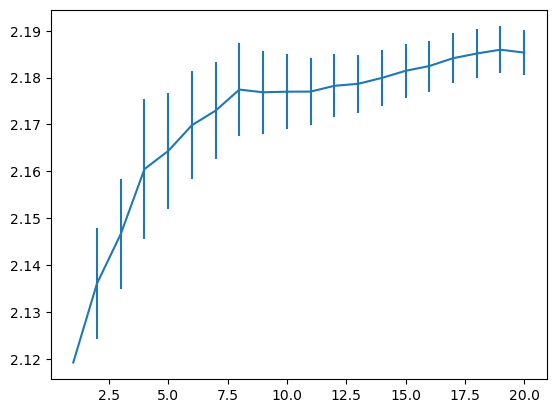

In [90]:
plt.errorbar(temp.BLOCK, temp.T_AVE, yerr=temp.ERROR)


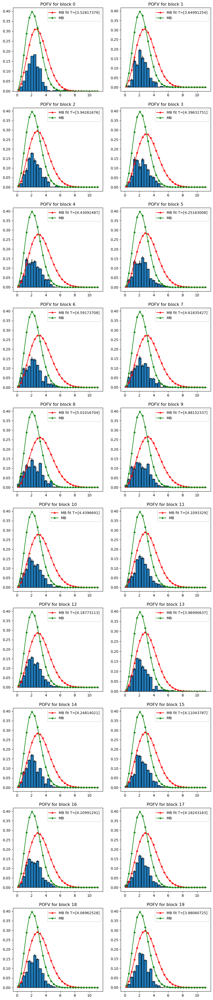

In [23]:
fig, ax=plt.subplots(nrows=10, ncols=2)
fig.set_figwidth(10)
fig.set_figheight(50)

for k in range(20):
    dfb=df.loc[df['block']==k].reset_index(drop=True)
    temp=curve_fit(MB, dfb['#vel'], dfb['avg_norm'])[0]
    ax[k//2,  k%2].set_title(f'POFV for block {k}')
    ax[k//2,  k%2].bar(
        dfb['#vel'], dfb['avg_norm'], 
        yerr=dfb['err_norm'], 
        width=dfb['#vel'].max()/30, edgecolor='black')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp)
        , marker='*', c='r', label=f'MB fit T={temp}')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], 2.18534)
        , marker='*', c='g', label=f'MB')
    
    ax[k//2, k%2].legend()
plt.show()

## Esercizio 04.2

In [24]:
df=pd.read_csv('pofv_delta.dat', header=None, names=['#vel', 'avg', 'err'], skiprows=1, sep="\s+")

In [24]:

df['avg_norm']=df['avg']/108
df['err_norm']=df['err']/108
df['block']=0
counter=0
df['block']=df.index//30
#for k in df.index[:]:
#    if k%30==0:
#        counter+=1
#    df['block'][k]=counter
    

<BarContainer object of 30 artists>

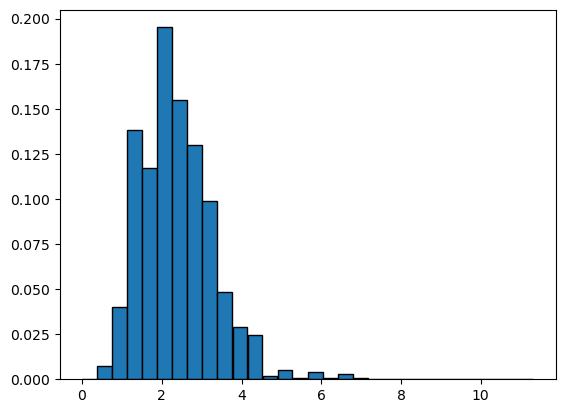

In [25]:
df0=df.loc[df['block']==1]
plt.bar(df0['#vel'], df0['avg_norm'], width=df0['#vel'].max()/30, edgecolor='black')


In [26]:
temp_s=pd.read_csv(
    'NSL_SIMULATOR/OUTPUT/temperature.dat', delim_whitespace=True,
    names=['# BLOCK:', 'ACTUAL_T:', 'T_AVE:', 'ERROR:'], skiprows=1)
temp_s

/tmp/ipykernel_543294/2205261457.py:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  temp_s=pd.read_csv(


,# BLOCK:,ACTUAL_T:,T_AVE:,ERROR:
0,1,2.11923,2.11923,0.000000
1,2,2.15294,2.13608,0.011917
2,3,2.16769,2.14662,0.011709
3,4,2.20211,2.16049,0.014881
4,5,2.17977,2.16435,0.012394
5,6,2.19737,2.16985,0.011486
6,7,2.19166,2.17297,0.010259
7,8,2.20886,2.17745,0.009910
8,9,2.17223,2.17687,0.008825
9,10,2.17812,2.17700,0.007944


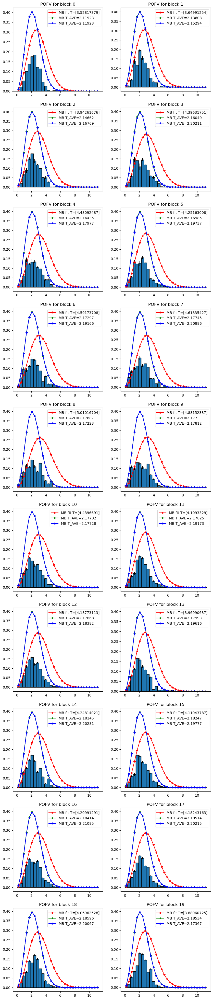

In [27]:
fig, ax=plt.subplots(nrows=10, ncols=2)
fig.set_figwidth(10)
fig.set_figheight(50)

for k in range(20):
    dfb=df.loc[df['block']==k].reset_index(drop=True)
    temp=curve_fit(MB, dfb['#vel'], dfb['avg_norm'])[0]
    ax[k//2,  k%2].set_title(f'POFV for block {k}')
    ax[k//2,  k%2].bar(
        dfb['#vel'], dfb['avg_norm'], 
        yerr=dfb['err_norm'], 
        width=dfb['#vel'].max()/30, edgecolor='black')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp)
        , marker='*', c='r', label=f'MB fit T={temp}')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp_s['T_AVE:'][k])
        , marker='*', c='g', label=f'MB T_AVE={temp_s["T_AVE:"][k]}')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp_s['ACTUAL_T:'][k])
        , marker='*', c='b', label=f'MB T_AVE={temp_s["ACTUAL_T:"][k]}')
    
    
    
    ax[k//2, k%2].legend()
plt.show()

In [35]:
df=pd.read_csv(
    'NSL_SIMULATOR/OUTPUT/pofv.dat', 
    header=None, 
    names=['#vel', 'avg', 'prog_avg', 'err'], skiprows=1, sep="\s+")

In [36]:
df

,#vel,avg,prog_avg,err
0,0.094281,0.000,0.000000,0.000000
1,0.282843,0.000,0.000000,0.000000
2,0.471405,0.000,0.000000,0.000000
3,0.659966,0.000,0.000000,0.000000
4,0.848528,0.000,0.000000,0.000000
...,...,...,...,...
5995,4.808330,0.085,0.595150,0.052835
5996,4.996890,0.045,0.585650,0.053568
5997,5.185450,0.515,0.243575,0.027687
5998,5.374010,0.370,0.175650,0.025575


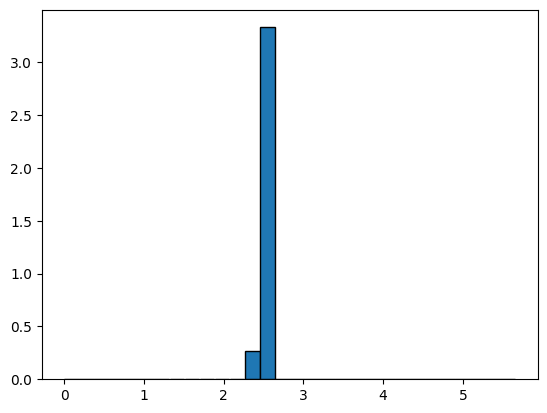

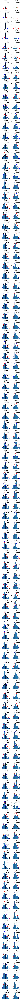

In [41]:

df['avg_norm']=df['avg']/30
df['err_norm']=df['err']/30
df['block']=0
counter=0
df['block']=df.index//30
#for k in df.index[:]:
#    if k%30==0:
#        counter+=1
#    df['block'][k]=counter
    

df0=df.loc[df['block']==1]
plt.bar(df0['#vel'], df0['avg_norm'], width=df0['#vel'].max()/30, edgecolor='black')


temp_s=pd.read_csv(
    'NSL_SIMULATOR/OUTPUT/temperature.dat', delim_whitespace=True,
    names=['# BLOCK:', 'ACTUAL_T:', 'T_AVE:', 'ERROR:'], skiprows=1)
temp_s

fig, ax=plt.subplots(nrows=100, ncols=2)
fig.set_figwidth(10)
fig.set_figheight(500)

for k in range(200):
    dfb=df.loc[df['block']==k].reset_index(drop=True)
    temp=curve_fit(MB, dfb['#vel'], dfb['avg_norm'])[0]
    ax[k//2,  k%2].set_title(f'POFV for block {k}')
    ax[k//2,  k%2].bar(
        dfb['#vel'], dfb['avg_norm'], 
        yerr=dfb['err_norm'], 
        width=dfb['#vel'].max()/30, edgecolor='black')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp)
        , marker='*', c='r', label=f'MB fit T={temp}')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp_s['T_AVE:'][k])
        , marker='*', c='g', label=f'MB T_AVE={temp_s["T_AVE:"][k]}')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp_s['ACTUAL_T:'][k])
        , marker='*', c='b', label=f'MB T_AVE={temp_s["ACTUAL_T:"][k]}')
    
    
    
    ax[k//2, k%2].legend()
plt.show()

## Esercizio 04.3 [back to the future]

([<matplotlib.axis.XTick at 0x7ff238f703d0>,
 [Text(0, 0, '\x00'),
  Text(1, 0, '\x01'),
  Text(2, 0, '\x02'),
  Text(3, 0, '\x03'),
  Text(4, 0, '\x04'),
  Text(5, 0, '\x05'),
  Text(6, 0, '\x06'),
  Text(7, 0, '\x07'),
  Text(8, 0, '\x08'),
  Text(9, 0, '\t'),
  Text(10, 0, '\n'),
  Text(11, 0, '\x0b'),
  Text(12, 0, '\x0c'),
  Text(13, 0, '\r'),
  Text(14, 0, '\x0e'),
  Text(15, 0, '\x0f'),
  Text(16, 0, '\x10'),
  Text(17, 0, '\x11'),
  Text(18, 0, '\x12'),
  Text(19, 0, '\x13')])

/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 0 ( ) missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 1 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 2 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 3 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 4 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 5 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserW

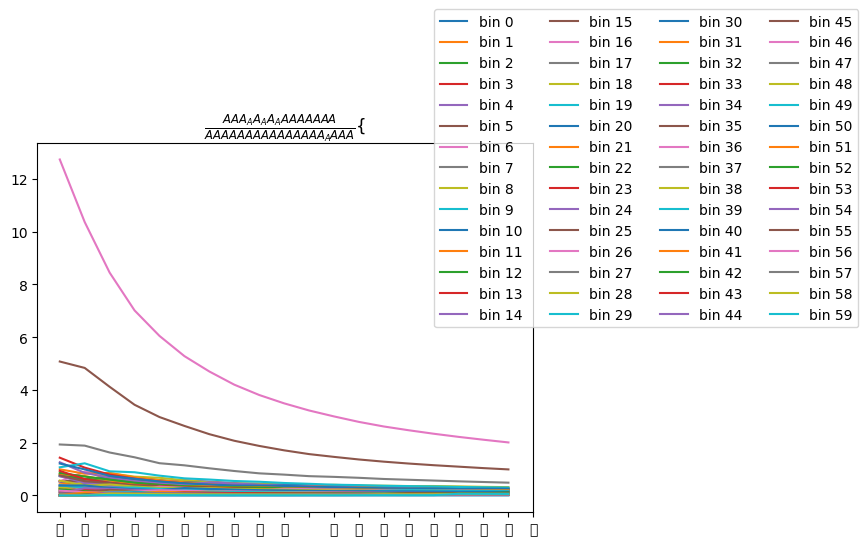

In [175]:
plt.title(r'$\frac{AAA_AA_AA_AAAAAAAA}{AAAAAAAAAAAAAAA_AAAA}\{$')
for j in range(60):
    plt.plot([df.loc[df['block']==k].reset_index().err[j] for k in range(1, 20)], label=f'bin {j}')
plt.legend(ncols=4, loc=(0.8,0.5))
plt.xticks(range(0, 20), [chr(k) for k in range(20)])
